<center>
    <img src='images/logo.png' width='400px'>
    <h1>MÔN HỌC: THỊ GIÁC MÁY TÍNH (7080518)</h1>
<h2> Chương 2: XỬ LÝ VÀ NÂNG CAO CHẤT LƯỢNG ẢNH - Phần 2</h2>
</center>

---
Xử lý ảnh (Image processing): là quá trình tạo ra ảnh mới từ ảnh có sẵn, VD: tăng độ sáng, cắt ảnh, khử nhiễu,… không tập trung vào việc hiểu nội dung của bức ảnh.

**Nội dung bài học - phần 2:**

**II. Cải thiện chất lượng ảnh:**

1. Cơ bản về cải thiện chất lượng ảnh
2. Các phép toán trên điểm ảnh:
    * Đảo ảnh
    * Biến đổi gama
    * Chuyển đổi ảnh nhị phân (cắt ngưỡng)
    * Câng bằng sáng histogram
---
*Copyright @dangvannam.FIT.HUMG*

In [1]:
#Khai báo sử dụng thư viện:
import numpy as np
import matplotlib.pyplot as plt
import cv2
print('Version OpenCV:', cv2.__version__)

Version OpenCV: 4.9.0


## 2.1 Đảo ảnh 
---
Với các ảnh có mức xám trong vùng [0,N]
thực hiện thao tác xử lý điểm ảnh có dạng s = N - r trong đó:
* s: là điểm ảnh đã xử lý
* r: điểm đầu vào
* N: mức xám cực đại

In [3]:
#Đọc ảnh xám
img = cv2.imread('images/Pic_test.jpg',0)

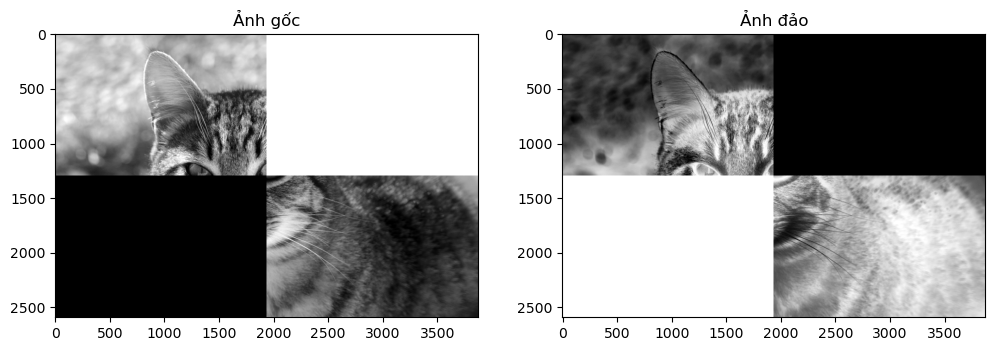

In [10]:
# Hiển thị ảnh
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title('Ảnh gốc')

# Thực hiện đảo ảnh
plt.subplot(1,2,2)
img_dao = img.max() - img
plt.imshow(img_dao, cmap='gray')
plt.title('Ảnh đảo')

plt.show()

In [9]:
# Pixel ảnh gốc
img

array([[199, 196, 194, ..., 255, 255, 255],
       [198, 196, 195, ..., 255, 255, 255],
       [197, 196, 196, ..., 255, 255, 255],
       ...,
       [  0,   0,   0, ...,  22,  20,  19],
       [  0,   0,   0, ...,  22,  21,  21],
       [  0,   0,   0, ...,  23,  23,  24]], dtype=uint8)

In [ ]:
#Pixel ảnh gốc:


In [11]:
#Pixel ảnh đảo:
img_dao

array([[ 56,  59,  61, ...,   0,   0,   0],
       [ 57,  59,  60, ...,   0,   0,   0],
       [ 58,  59,  59, ...,   0,   0,   0],
       ...,
       [255, 255, 255, ..., 233, 235, 236],
       [255, 255, 255, ..., 233, 234, 234],
       [255, 255, 255, ..., 232, 232, 231]], dtype=uint8)

In [14]:
#Xây dựng Hàm đảo ảnh:
def dao_anh(img):
    return img.max()-img

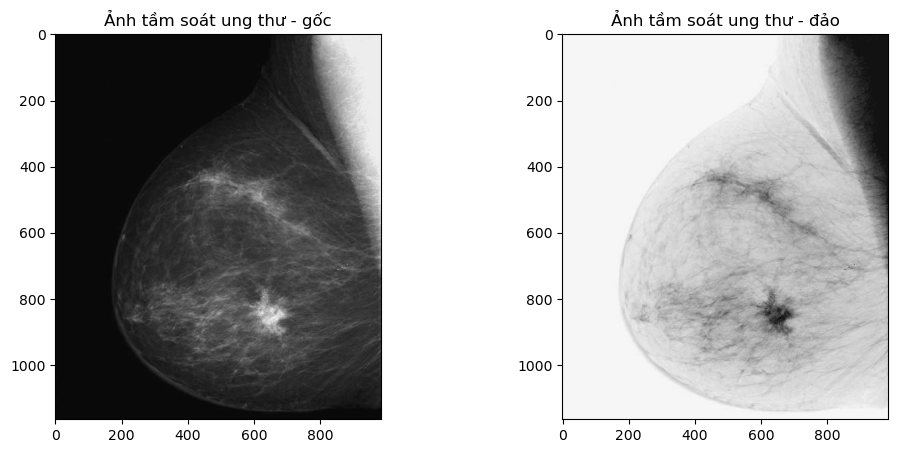

In [17]:
#Đảo ảnh trong Y tế:
#Đọc ảnh gốc:
img_yte = cv2.imread('images/pic_healthcare.tif',0)

# Thực hiện đảo ảnh với hàm
img_yte_dao = dao_anh(img_yte)

# Hiển thị ảnh gốc:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_yte,cmap='gray')
plt.title('Ảnh tầm soát ung thư - gốc')

plt.subplot(1,2,2)
plt.imshow(img_yte_dao,cmap='gray')
plt.title('Ảnh tầm soát ung thư - đảo')

plt.show()

In [18]:
#Giá trị pixel ảnh gốc:
img_yte

array([[ 38,  38,  38, ..., 238, 238, 238],
       [ 38,  38,  38, ..., 238, 238, 238],
       [ 35,  35,  35, ..., 238, 238, 238],
       ...,
       [ 31,  31,  31, ...,  30,  30,  30],
       [ 31,  31,  31, ...,  30,  30,  30],
       [ 31,  31,  31, ...,  30,  30,  30]], dtype=uint8)

In [19]:
#Giá trị max:
img_yte.max()

255

In [20]:
#Giá trị pixel ảnh đảo:
img_yte_dao

array([[217, 217, 217, ...,  17,  17,  17],
       [217, 217, 217, ...,  17,  17,  17],
       [220, 220, 220, ...,  17,  17,  17],
       ...,
       [224, 224, 224, ..., 225, 225, 225],
       [224, 224, 224, ..., 225, 225, 225],
       [224, 224, 224, ..., 225, 225, 225]], dtype=uint8)

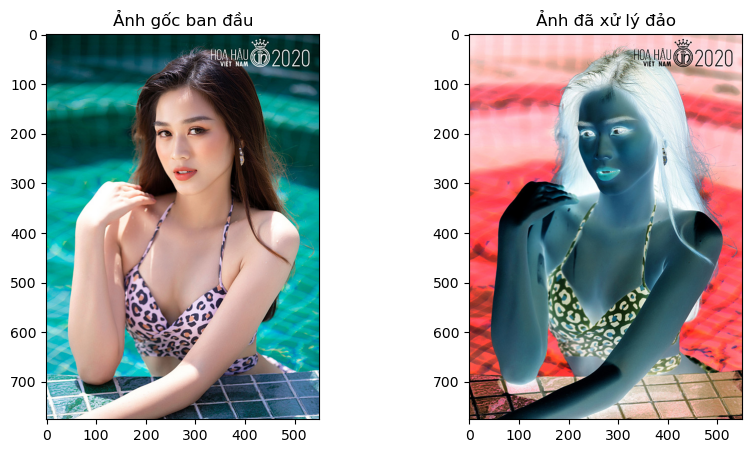

In [21]:
#Trường hợp đảo ảnh màu:
#-----------------------------------------
#Đọc ảnh gốc:
img = cv2.imread('images/pic_color.jpg')
#Thực hiện đảo ảnh:
img_dao = dao_anh(img)

#Hiển thị kết quả:
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.title('Ảnh gốc ban đầu')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_dao,cv2.COLOR_BGR2RGB))
plt.title('Ảnh đã xử lý đảo')
plt.show()

## THỰC HÀNH 2.4: 
---
**Yêu cầu 1:** Sinh viên đọc ảnh images/Thuchanh2_4.jpeg và hiển thị ảnh

**Yêu cầu 2:** Thực hiện đảo ảnh và hiển thị kết quả. Lưu file ảnh đã đảo vào thư mục Saves/MSV_daoanh.jpg

<img src='images/Thuchanh2_4.jpeg' width='300px'>

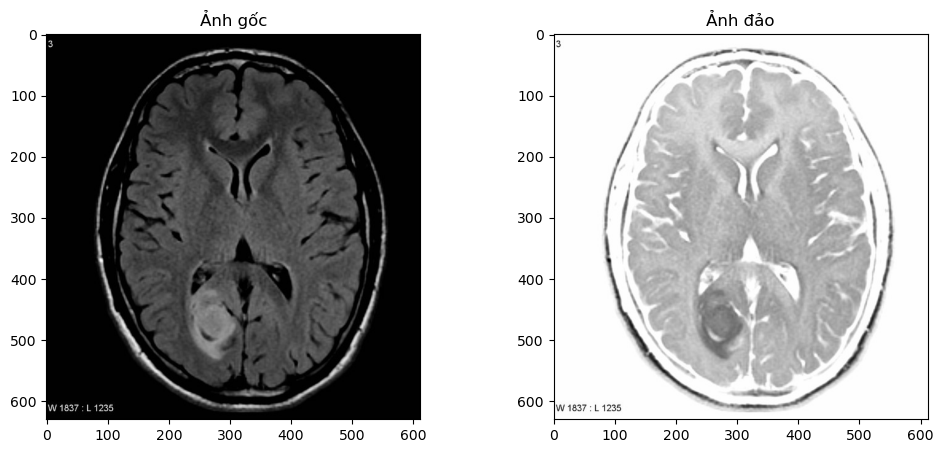

In [25]:
#{SINH VIÊN VIẾT CODE Ở ĐÂY}
# Đọc hình ảnh
img_th2_4 = cv2.imread('images/Thuchanh2_4.jpeg')

# Hiển Thị hình ảnh
# Hiển thị ảnh gốc:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_th2_4,cmap='gray')
plt.title('Ảnh gốc')

img_th2_4_dao = dao_anh(img_th2_4)
plt.subplot(1,2,2)
plt.imshow(img_th2_4_dao,cmap='gray')
plt.title('Ảnh đảo')

plt.show()



In [41]:
cv2.imwrite('images/Saves/2121050720_daoanh.jpg', img_th2_4_dao)

True

## 2.2 Biến đổi hàm mũ
---
Phép toán biến đổi ảnh bằng hàm mũ có dạng: 

**s = c * r^a**

Trong đó:
* s: điểm ảnh đã xử lý
* r: điểm ảnh ban đầu
* c,a: các hằng số

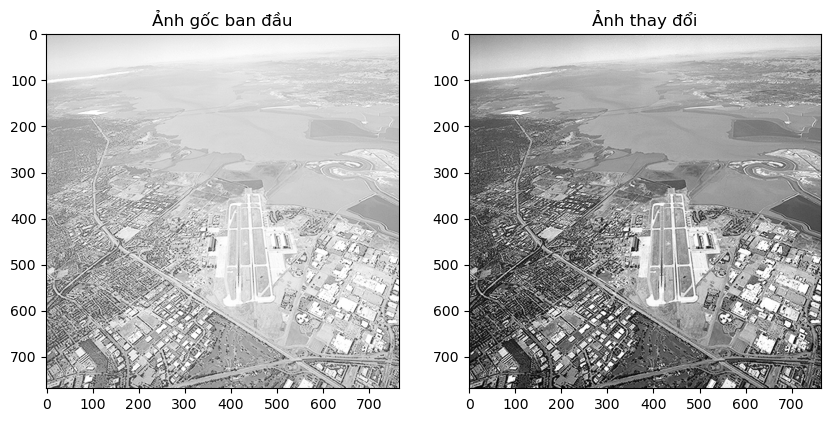

In [30]:
#Đọc ảnh gốc:
img_sanbay = cv2.imread('images/pic_sanbay.tif',0)

# Biến đổi ảnh với hàm mũ
c = 1
a = 2.5
img_gamma = c*pow(img_sanbay, a)
# Chuyển các phần tử sang kiểu số nguyên 
img_gamma = img_gamma.astype(np.int32)


#Hiển thị kết quả:
plt.figure(figsize=(10,8))

plt.subplot(1,2,1)
plt.imshow(img_sanbay, cmap='gray')
plt.title('Ảnh gốc ban đầu')


plt.subplot(1,2,2)
plt.imshow(img_gamma,cmap='gray')
plt.title('Ảnh thay đổi')

plt.show()

In [31]:
# Ảnh gốc
img_sanbay

array([[199, 199, 199, ..., 230, 229, 232],
       [199, 199, 200, ..., 231, 229, 231],
       [200, 200, 200, ..., 232, 229, 229],
       ...,
       [213, 213, 217, ..., 215, 208, 211],
       [199, 199, 211, ..., 198, 202, 217],
       [199, 199, 211, ..., 198, 202, 217]], dtype=uint8)

In [32]:
# Ảnh sau biến đổi gamma
img_gamma

array([[558640, 558640, 558640, ..., 802268, 793576, 819822],
       [558640, 558640, 565685, ..., 811016, 793576, 811016],
       [565685, 565685, 565685, ..., 819822, 793576, 793576],
       ...,
       [662138, 662138, 693664, ..., 677791, 623962, 646704],
       [558640, 558640, 646704, ..., 551649, 579933, 693664],
       [558640, 558640, 646704, ..., 551649, 579933, 693664]])

In [33]:
# Phần tử lớn nhất
img_sanbay.max()

255

In [34]:
img_gamma.max()

1038365

In [35]:
#Viết hàm xử lý ảnh với hàm mũ:
def pic_gamma(img,c,a):
    #Biến đổi hàm mũ:
    img1 = c*pow(img,a)
    #Chuyển các phần tử về số nguyên:
    img1 = img1.astype(np.int32)
    return img1

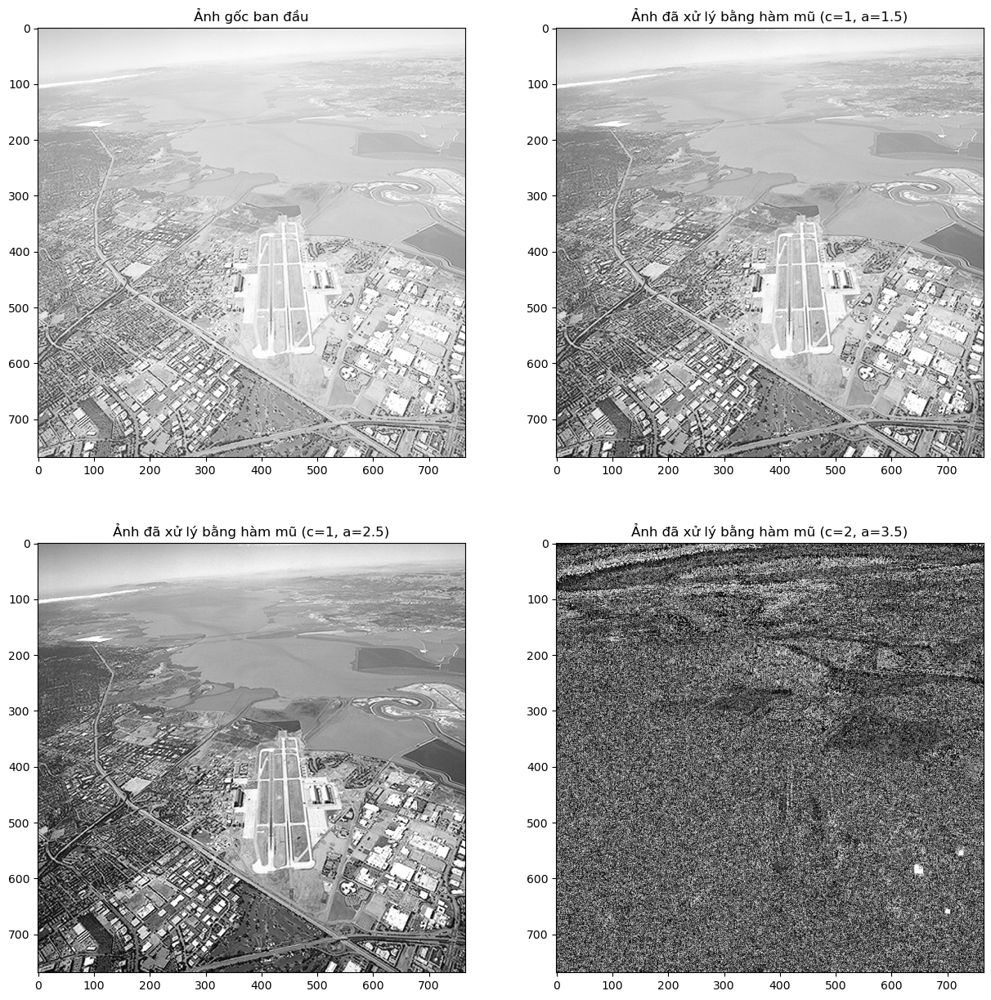

In [36]:
#Biến đổi ảnh với hàm mũ sử dụng các tham số khác nhau:
pic1 = pic_gamma(img,1,1.5)
pic2 = pic_gamma(img,1,2.5)
pic3 = pic_gamma(img,5,5)

#Hiển thị kết quả:
plt.figure(figsize=(15,15))
plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Ảnh gốc ban đầu')

plt.subplot(2, 2, 2)
plt.imshow(pic1, cmap='gray')
plt.title('Ảnh đã xử lý bằng hàm mũ (c=1, a=1.5)')

plt.subplot(2, 2, 3)
plt.imshow(pic2, cmap='gray')
plt.title('Ảnh đã xử lý bằng hàm mũ (c=1, a=2.5)')

plt.subplot(2, 2, 4)
plt.imshow(pic3, cmap='gray')
plt.title('Ảnh đã xử lý bằng hàm mũ (c=2, a=3.5)')
plt.show()

## THỰC HÀNH 2.5: 
---
**Yêu cầu 1:** Sinh viên đọc ảnh images/Thuchanh2_5.jpg ở dạng xám

**Yêu cầu 2:** Thiết lập tham số c, a phù hợp để tăng cường chất lượng ảnh và hiển thị kết quả (slide). Lưu file ảnh đã  đổi vào thư mục Saves/MSV_gamma.jpg

<img src='images/Thuchanh2_5.jpg' width='300px'>

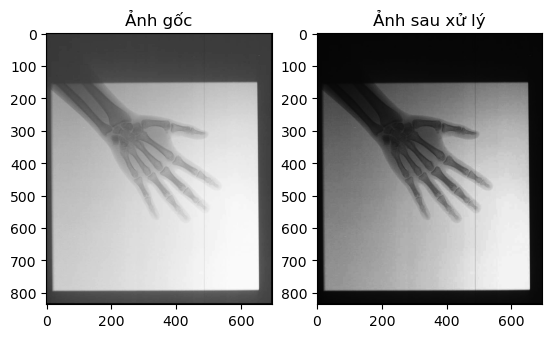

In [38]:
#{SINH VIÊN VIẾT CODE Ở ĐÂY}
img_th2_5 = cv2.imread('images/Thuchanh2_5.jpg', 0)
img_th2_5_gamma = pic_gamma(img_th2_5,1,2.5)

plt.subplot(1, 2, 1)
plt.imshow(img_th2_5, cmap='gray')
plt.title('Ảnh gốc')

plt.subplot(1, 2, 2)
plt.imshow(img_th2_5_gamma, cmap='gray')
plt.title('Ảnh sau xử lý')
plt.show()




In [40]:
# Lưu ảnh
cv2.imwrite('images/Saves/2121050720_gamma.jpg', img_th2_5_gamma)

True

## 2.3 Chuyển đổi sang ảnh nhị phân (cắt ngưỡng)
---
Sử dụng một ngưỡng (threshold) T để xử lý. Nếu:
* r<T thì s=0
* r>=T thì s=N (hoặc s = 1)

Ảnh là một ma trận nên có thể sử dụng các Hàm với ma trận của thư viên Numpy
- np.where(img<T, a, b): điều kiện đúng trả về a, sai trả về b

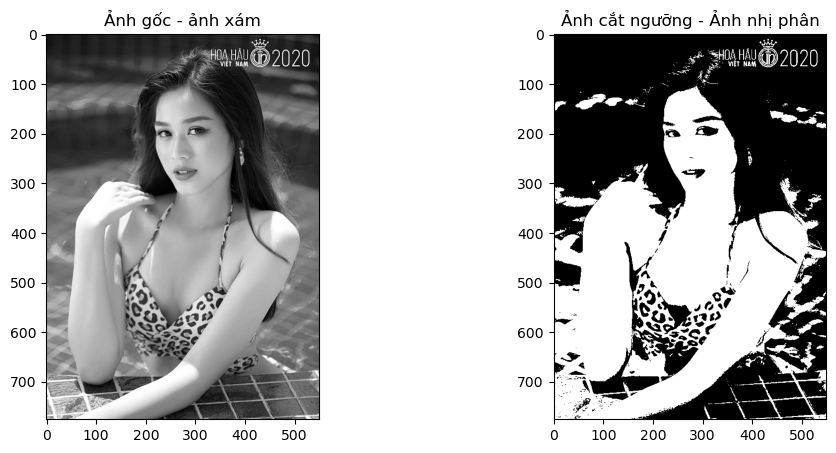

In [51]:
#Đọc ảnh xám:
img_hoahau = cv2.imread('images/pic_gray.png', 0)

# Cắt ngưỡng ảnh xám
T = 127

# Thực hiện biến đổ <T = 0, >=T = 255
img_hoahau_T = np.where(img_hoahau<T,0,255)

# Hiển thị kết quả
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_hoahau, cmap='gray')
plt.title('Ảnh gốc - ảnh xám')


plt.subplot(1,2,2)
plt.imshow(img_hoahau_T, cmap='gray')
plt.title('Ảnh cắt ngưỡng - Ảnh nhị phân')
plt.show()

In [45]:
#ảnh gốc
img_hoahau

array([[ 22,  22,  22, ...,  20,  20,  20],
       [ 21,  21,  21, ...,  19,  18,  18],
       [ 22,  22,  22, ...,  19,  19,  18],
       ...,
       [195, 185, 179, ..., 154, 157, 143],
       [176, 187, 188, ..., 183, 164, 168],
       [192, 186, 179, ..., 201, 180, 179]], dtype=uint8)

In [46]:
#Ảnh sau cắt ngưỡng T
img_hoahau_T

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]])

### Trong openCV cũng xây dựng phương thức thực hiện việc cắt ngưỡng: Simple Thresholding

ret,thresh1 = cv2.threshold(img,T,max,type)

trong đó:
* img: ảnh gốc
* T: giá trị ngưỡng
* max: giá trị đc gán nếu > ngưỡng T
* type: Loại xử lý cắt ngưỡng

[[  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
127.0


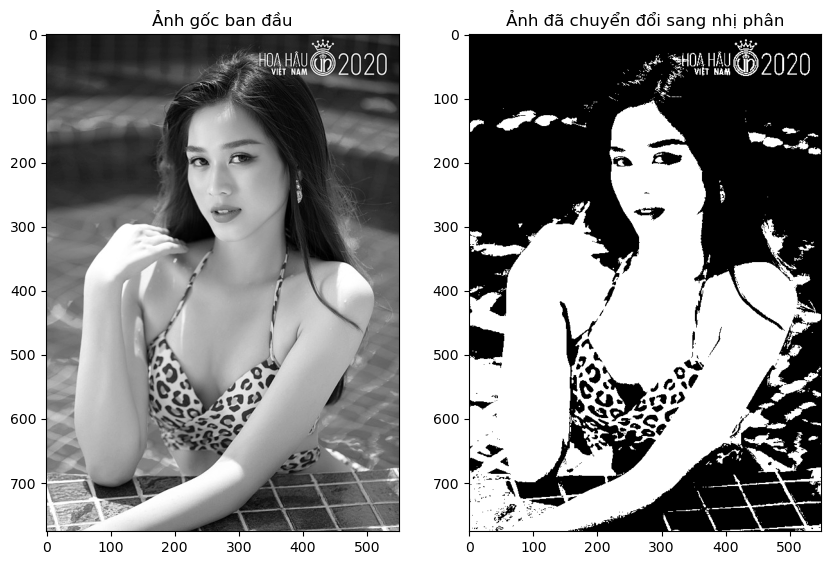

In [53]:
#Sử dụng phương thức threshold:
ret,pic = cv2.threshold(img_hoahau,127,255,cv2.THRESH_BINARY)

print(pic)
print(ret)
#Hiển thị kết quả:
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img_hoahau, cmap='gray')
plt.title('Ảnh gốc ban đầu')

plt.subplot(1, 2, 2)
plt.imshow(pic, cmap='gray')
plt.title('Ảnh đã chuyển đổi sang nhị phân')
plt.show()

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]
127.0


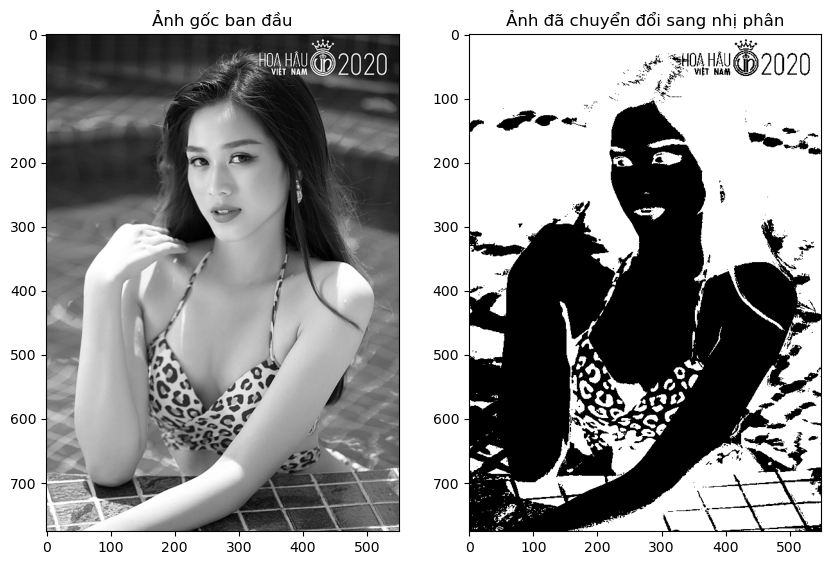

In [54]:
#Sử dụng phương thức threshold:
ret,pic = cv2.threshold(img_hoahau,127,255,cv2.THRESH_BINARY_INV)

print(pic)
print(ret)
#Hiển thị kết quả:
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img_hoahau, cmap='gray')
plt.title('Ảnh gốc ban đầu')

plt.subplot(1, 2, 2)
plt.imshow(pic, cmap='gray')
plt.title('Ảnh đã chuyển đổi sang nhị phân')
plt.show()

Thuật toán sample thresholding của opencv còn có 1 tham số quan trọng là loại ngưỡng (type). opencv hỗ trợ 8 loại là: THRESH_BINARY, THRESH_BINARY_INV, THRESH_TRUNC, THRESH_TOZERO, THRESH_TOZERO_INV, THRESH_MASK, THRESH_OTSU, THRESH_TRIANGLE. Ý nghĩa của từng loại như sau:

* THRESH_BINARY: Có thể dịch là ngưỡng nhị phân. Ý nghĩa y hệt những gì đề cập ở trên.

* THRESH_BINARY_INV: Ngưỡng nhị phân đảo ngược. Có thể hiểu là nó sẽ đảo ngược lại kết quả của THRESH_BINARY.

* THRESH_TRUNC: Những giá trị điểm ảnh bé hơn ngưỡng sẽ giữ nguyên giá trị, những điểm ảnh lớn hơn hoặc bằng ngưỡng sẽ được gán lại là maxvalue.

* THRESH_TOZERO: Những điểm ảnh bé hơn ngưỡng sẽ bị gán thành 0, những điểm còn lại giữ nguyên.

* THRESH_TOZERO_INV: Những điểm ảnh nhỏ hơn giá trị ngưỡng sẽ được giữ nguyên, những điểm ảnh còn lại sẽ bị gán thành 0.

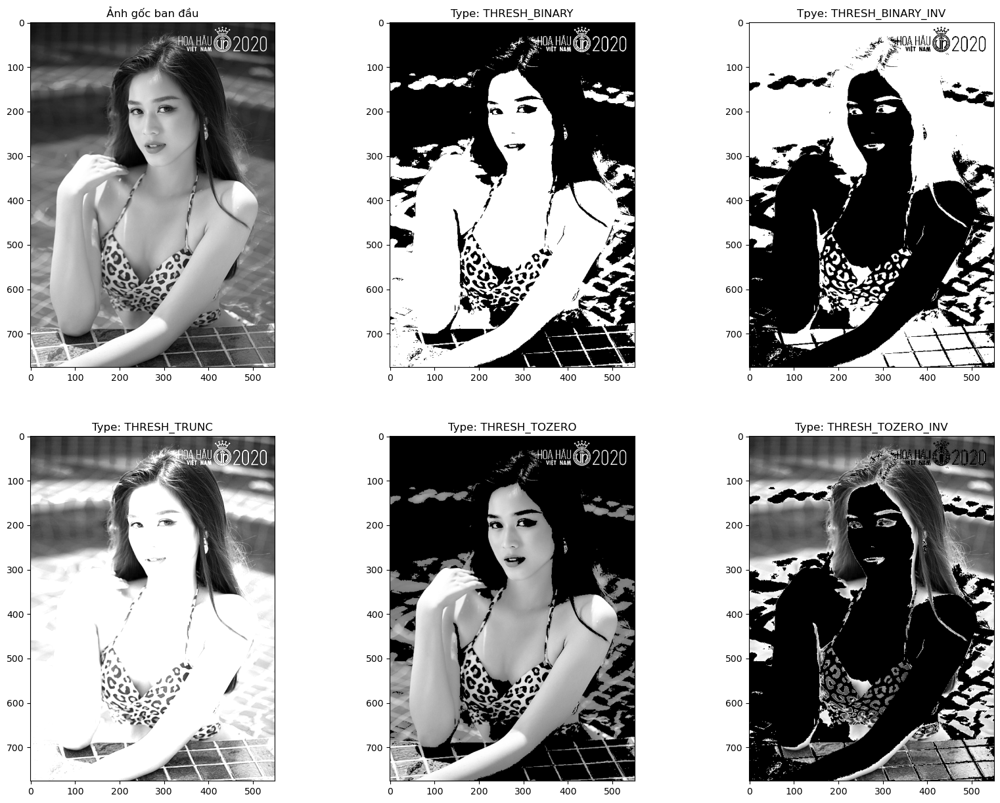

In [55]:
#Sử dụng các loại ngưỡng khác nhau:
ret,pic1 = cv2.threshold(img_hoahau,120,255,cv2.THRESH_BINARY)
ret,pic2 = cv2.threshold(img_hoahau,120,255,cv2.THRESH_BINARY_INV)
ret,pic3 = cv2.threshold(img_hoahau,120,255,cv2.THRESH_TRUNC)
ret,pic4 = cv2.threshold(img_hoahau,120,255,cv2.THRESH_TOZERO)
ret,pic5 = cv2.threshold(img_hoahau,120,255,cv2.THRESH_TOZERO_INV)

#Hiển thị kết quả:
plt.figure(figsize=(20,15))
plt.subplot(2, 3, 1)
plt.imshow(img_hoahau, cmap='gray')
plt.title('Ảnh gốc ban đầu')

plt.subplot(2, 3, 2)
plt.imshow(pic1, cmap='gray')
plt.title('Type: THRESH_BINARY')

plt.subplot(2, 3, 3)
plt.imshow(pic2, cmap='gray')
plt.title('Tpye: THRESH_BINARY_INV')

plt.subplot(2, 3, 4)
plt.imshow(pic3, cmap='gray')
plt.title('Type: THRESH_TRUNC')

plt.subplot(2, 3, 5)
plt.imshow(pic4, cmap='gray')
plt.title('Type: THRESH_TOZERO')

plt.subplot(2, 3, 6)
plt.imshow(pic5, cmap='gray')
plt.title('Type: THRESH_TOZERO_INV')
plt.show()


## THỰC HÀNH 2.6: 
---
**Yêu cầu 1:** Sinh viên đọc ảnh images/Thuchanh2_6.jpg ở dạng xám

**Yêu cầu 2:** Thực hiện cắt ngưỡng ảnh với (Type = cv2.THRESH_BINARY) lần lượt với T = 50, 100, 150. Hiển thị kết quả như slide minh hoạ. Lưu ảnh vào thư mục Saves

**Yêu cầu 3:** Thiết lập T = 75. Thực hiện cắt ngưỡng với Type = cv2.THRESH_TRUNC, cv2.THRESH_BINARY_INV, cv2.THRESH_TOZERO. Hiển thị kết quả như slide minh hoạ. Lưu ảnh vào thư mục Saves
<img src='images/Thuchanh2_6.jpg' width='300px'>

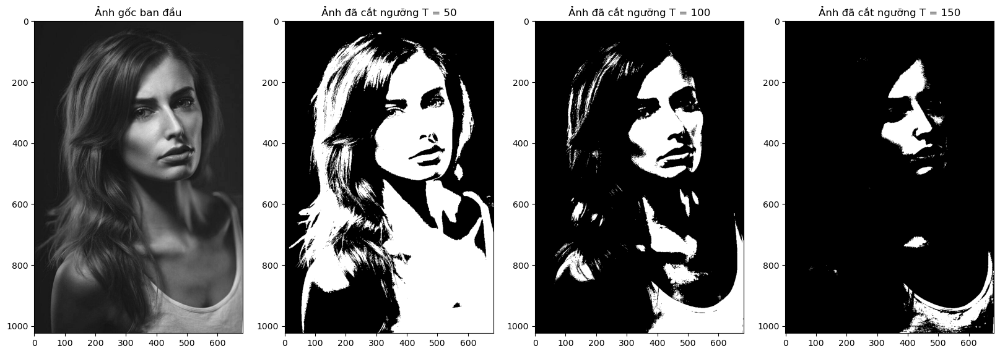

In [62]:
#{SINH VIÊN VIẾT CODE Ở ĐÂY}
img_th2_6 = cv2.imread('images/Thuchanh2_6.jpg',0)
# Yêu cầu 2
ret,pic1 = cv2.threshold(img_th2_6,50,255,cv2.THRESH_BINARY)
ret,pic2 = cv2.threshold(img_th2_6,100,255,cv2.THRESH_BINARY)
ret,pic3 = cv2.threshold(img_th2_6,150,255,cv2.THRESH_BINARY)


#Hiển thị kết quả:
plt.figure(figsize=(20,8))
plt.subplot(1, 4, 1)
plt.imshow(img_th2_6, cmap='gray')
plt.title('Ảnh gốc ban đầu')

plt.subplot(1, 4, 2)
plt.imshow(pic1, cmap='gray')
plt.title('Ảnh đã cắt ngưỡng T = 50')

plt.subplot(1, 4, 3)
plt.imshow(pic2, cmap='gray')
plt.title('Ảnh đã cắt ngưỡng T = 100')

plt.subplot(1, 4, 4)
plt.imshow(pic3, cmap='gray')
plt.title('Ảnh đã cắt ngưỡng T = 150')


plt.show()

In [79]:
# Lưu ảnh yêu cầu 2:
cv2.imwrite('images/Saves/2121050720_T50.jpg', pic1)
cv2.imwrite('images/Saves/2121050720_T100.jpg', pic2)
cv2.imwrite('images/Saves/2121050720_T150.jpg', pic3)

True

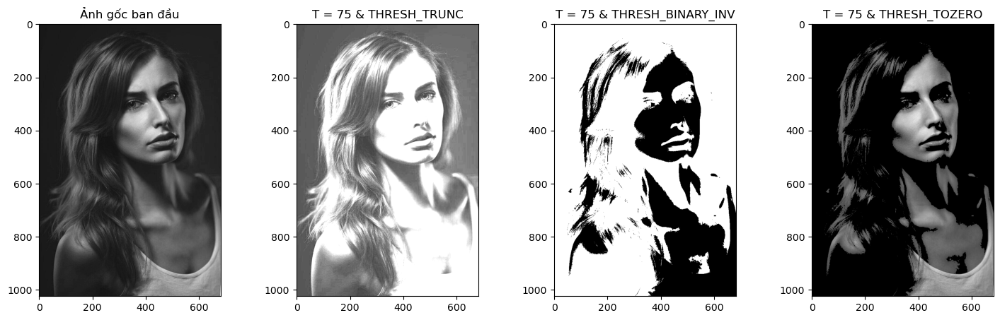

In [86]:
# Yêu cầu 3
ret,pic4 = cv2.threshold(img_th2_6,75,255,cv2.THRESH_TRUNC)
ret,pic5 = cv2.threshold(img_th2_6,75,255,cv2.THRESH_BINARY_INV)
ret,pic6 = cv2.threshold(img_th2_6,75,255,cv2.THRESH_TOZERO)

# Hiển thị hình ảnh
plt.figure(figsize=(18,5))
plt.subplot(1, 4, 1)
plt.imshow(img_th2_6, cmap='gray')
plt.title('Ảnh gốc ban đầu')

plt.subplot(1, 4, 2)
plt.imshow(pic4, cmap='gray')
plt.title('T = 75 & THRESH_TRUNC')

plt.subplot(1, 4, 3)
plt.imshow(pic5, cmap='gray')
plt.title('T = 75 & THRESH_BINARY_INV')

plt.subplot(1,4,4)
plt.imshow(pic6, cmap='gray')
plt.title('T = 75 & THRESH_TOZERO')
plt.show()

In [87]:
# Lưu ảnh
cv2.imwrite('images/Saves/2121050720_T=75&THRESH_TRUN.jpg', pic4)
cv2.imwrite('images/Saves/2121050720_T=75&THRESH_BINARY_INV.jpg', pic5)
cv2.imwrite('images/Saves/2121050720_T=75&THRESH_TOZERO.jpg', pic6)

True

## 2.2 Cân bằng sáng sử dụng cân bằng Histogram (Histogram equalization)
---

* Biểu đồ Histogram của ảnh là một dạng biểu đồ biểu diễn sự phân bố của số lượng điểm ảnh tương ứng với mức độ sáng tối của bức ảnh.

* Trong đó, trục dọc biểu diễn số lượng điểm ảnh, các đỉnh càng cao thì càng có nhiều điểm ảnh ở khu vực đó và độ chi tiết càng nhiều.
* Trục ngang tính từ trái qua phải với mốc giá trị từ 0 đến 255 biểu diễn độ sáng của mỗi khu vực ảnh. Gốc giá trị 0 được coi là tối nhất tựa như màu đen tuyền trong khi càng dịch sang phải giá trị này càng tăng, ngọn sáng nhất của ánh sáng ở giá trị 255.

Để tính được Histogram của một ảnh, ta có thể dùng một trong các hàm sau:

* cv2.calcHist() - https://docs.opencv.org/2.4/modules/imgproc/doc/histograms.html
* plt.hist() - https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html

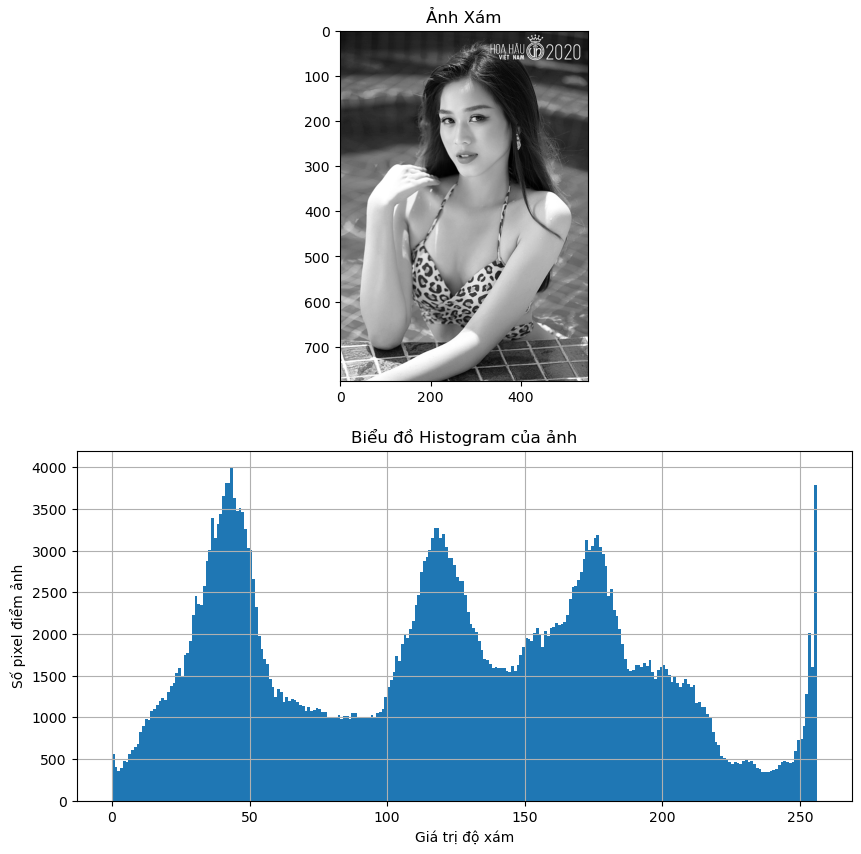

In [63]:
#Đọc ảnh và xem Histogram của ảnh Xám:
img_gray= cv2.imread('images/pic_gray.png',0)

#Hiển thị ảnh:
plt.figure(figsize=(10,10))
plt.subplot(2, 1, 1)
plt.imshow(img_gray,cmap='gray')
plt.title('Ảnh Xám')

plt.subplot(2, 1, 2)
plt.hist(img_gray.ravel(),256,[0,256]); 
plt.title('Biểu đồ Histogram của ảnh')
plt.xlabel('Giá trị độ xám')
plt.ylabel('Số pixel điểm ảnh')
plt.grid()

plt.show()

In [64]:
#Xác định số điểm ảnh có giá trị từ 0 --> 255
(unique, counts) = np.unique(img_gray, return_counts=True)
frequencies = np.asarray((unique, counts)).T
print(frequencies)

[[   0  558]
 [   1  406]
 [   2  360]
 [   3  390]
 [   4  478]
 [   5  461]
 [   6  560]
 [   7  609]
 [   8  647]
 [   9  675]
 [  10  821]
 [  11  897]
 [  12  985]
 [  13  967]
 [  14 1076]
 [  15 1101]
 [  16 1153]
 [  17 1200]
 [  18 1228]
 [  19 1208]
 [  20 1310]
 [  21 1371]
 [  22 1414]
 [  23 1535]
 [  24 1595]
 [  25 1499]
 [  26 1745]
 [  27 1769]
 [  28 1921]
 [  29 2231]
 [  30 2457]
 [  31 2362]
 [  32 2345]
 [  33 2571]
 [  34 2870]
 [  35 3005]
 [  36 3394]
 [  37 3152]
 [  38 3318]
 [  39 3440]
 [  40 3654]
 [  41 3812]
 [  42 3811]
 [  43 3998]
 [  44 3633]
 [  45 3475]
 [  46 3511]
 [  47 3461]
 [  48 3264]
 [  49 3030]
 [  50 3008]
 [  51 2657]
 [  52 2325]
 [  53 1975]
 [  54 1822]
 [  55 1702]
 [  56 1642]
 [  57 1461]
 [  58 1367]
 [  59 1248]
 [  60 1335]
 [  61 1310]
 [  62 1189]
 [  63 1241]
 [  64 1202]
 [  65 1217]
 [  66 1211]
 [  67 1187]
 [  68 1146]
 [  69 1142]
 [  70 1077]
 [  71 1129]
 [  72 1078]
 [  73 1085]
 [  74 1118]
 [  75 1105]
 [  76 1070]

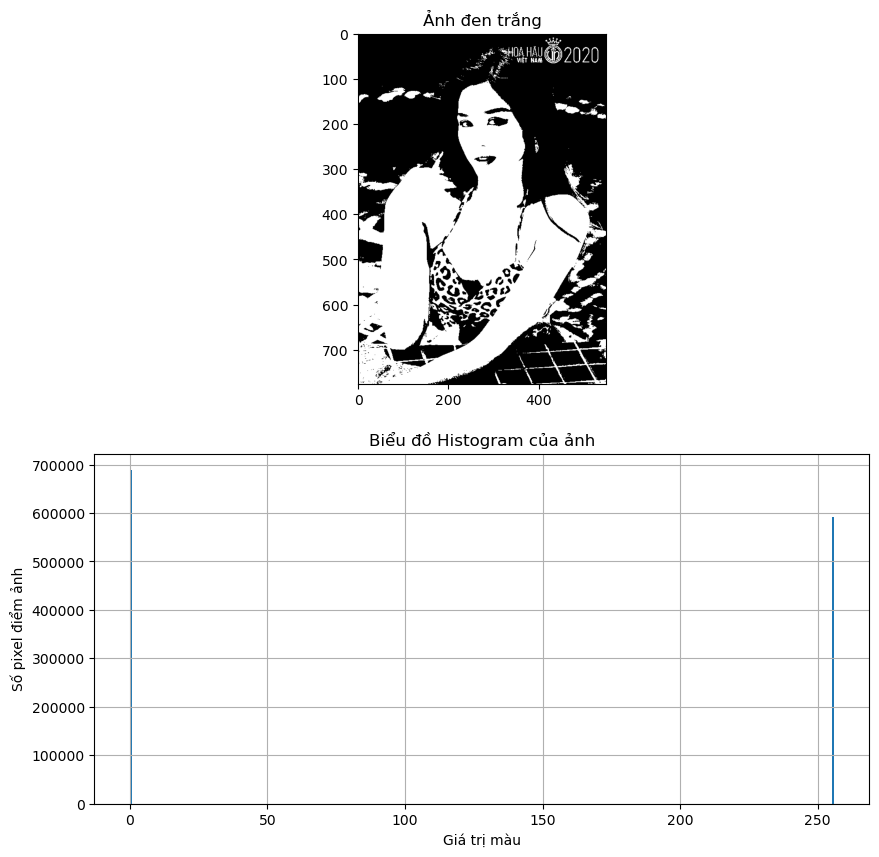

In [65]:
#Đọc ảnh và xem Histogram của ảnh Đen trắng:
img_binary= cv2.imread('images/pic_binary.png')

#Hiển thị ảnh:
plt.figure(figsize=(10,10))
plt.subplot(2, 1, 1)
plt.imshow(img_binary,cmap='gray')
plt.title('Ảnh đen trắng')

plt.subplot(2, 1, 2)
plt.hist(img_binary.ravel(),256,[0,256]); 
plt.title('Biểu đồ Histogram của ảnh')
plt.xlabel('Giá trị màu')
plt.ylabel('Số pixel điểm ảnh')
plt.grid()

plt.show()

In [66]:
#Xác định số điểm ảnh có giá trị 0 - số điểm ảnh có giá trị 255
(unique, counts) = np.unique(img_binary, return_counts=True)
frequencies = np.asarray((unique, counts)).T
print(frequencies)

[[     0 687897]
 [   255 592503]]


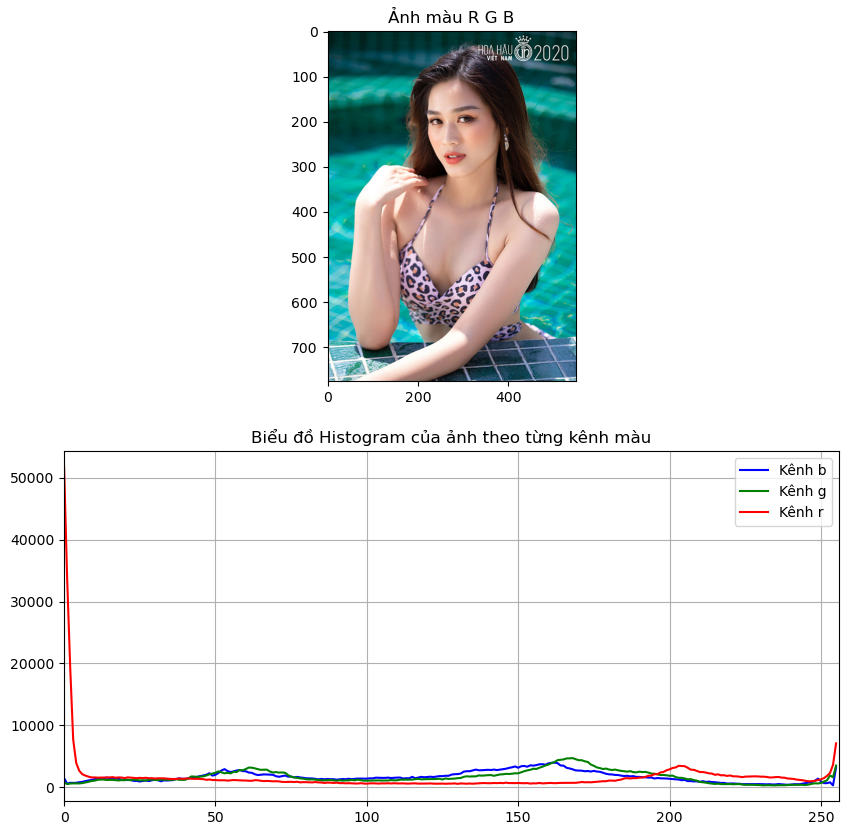

In [67]:
#Đọc ảnh và xem Histogram của ảnh màu
img_color= cv2.imread('images/pic_color.jpg')

#Hiển thị kết quả:
plt.figure(figsize=(10,10))
plt.subplot(2, 1, 1)
plt.imshow(cv2.cvtColor(img_color,cv2.COLOR_BGR2RGB))
plt.title('Ảnh màu R G B')

#Đối với ảnh màu, ta có thể xem Histogram của từng kênh màu
plt.subplot(2, 1, 2)
color = ('b','g','r')

for i,col in enumerate(color):
    histr = cv2.calcHist([img_color],[i],None,[256],[0,256])
    plt.plot(histr,color = col,label = 'Kênh ' + col)
    plt.xlim([0,256])
plt.title('Biểu đồ Histogram của ảnh theo từng kênh màu')
plt.legend()
plt.grid()

plt.show()

### Dựa vào Histogram có thể biết được bức ảnh là tối (dark) hay sáng (bright).
---


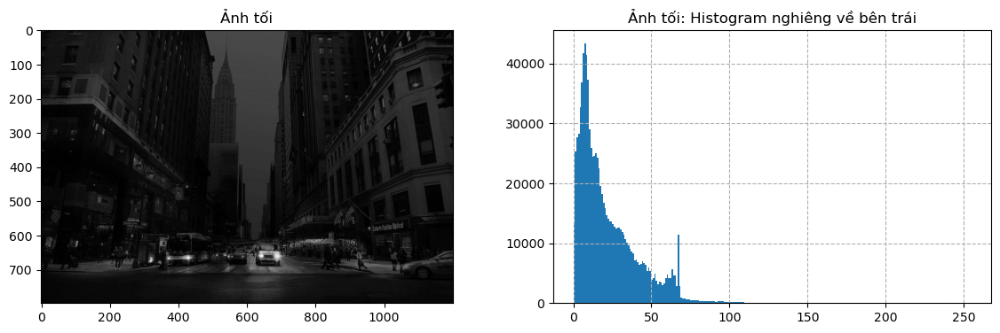

In [68]:
#Đọc ảnh pic1:
img1 = cv2.imread('images/pic1.jpg', 0)

#Hiển thị ảnh và Histogram tương ứng.
plt.figure(figsize=(14,4))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title('Ảnh tối')

plt.subplot(1, 2, 2)
plt.hist(img1.ravel(),256,[0,255])
plt.title('Ảnh tối: Histogram nghiêng về bên trái')
plt.grid(ls='--')
plt.show()

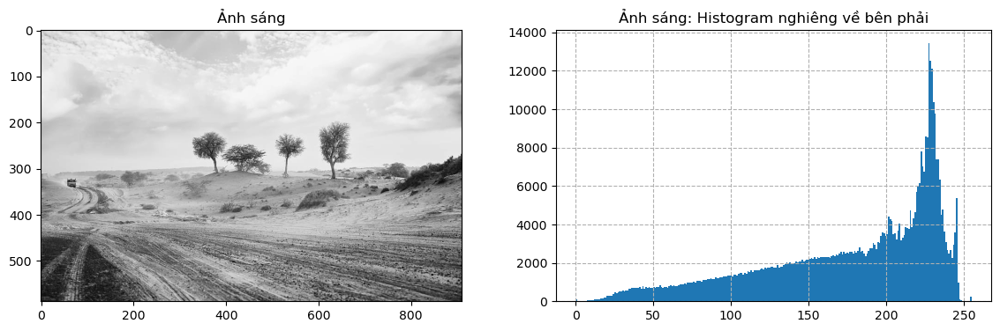

In [69]:
#Đọc ảnh pic2:
img2 = cv2.imread('images/pic2.jpg',0)

#Hiển thị ảnh và Histogram tương ứng.
plt.figure(figsize=(14,4))
plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray')
plt.title('Ảnh sáng')

plt.subplot(1, 2, 2)
plt.hist(img2.ravel(),256,[0,255])
plt.title('Ảnh sáng: Histogram nghiêng về bên phải')
plt.grid(ls='--')
plt.show()

### Thực hiện cân bằng sáng 
---
OpenCV hỗ trợ hàm cv2.equalizeHist() để cân bằng sáng. 
Trên ảnh gray sử dụng trực tiếp phương thức cv2.equlizeHist() để cân bằng trên toàn bộ ảnh. (ko có tác dụng khi cân bằng sáng cho ảnh nhị phân)

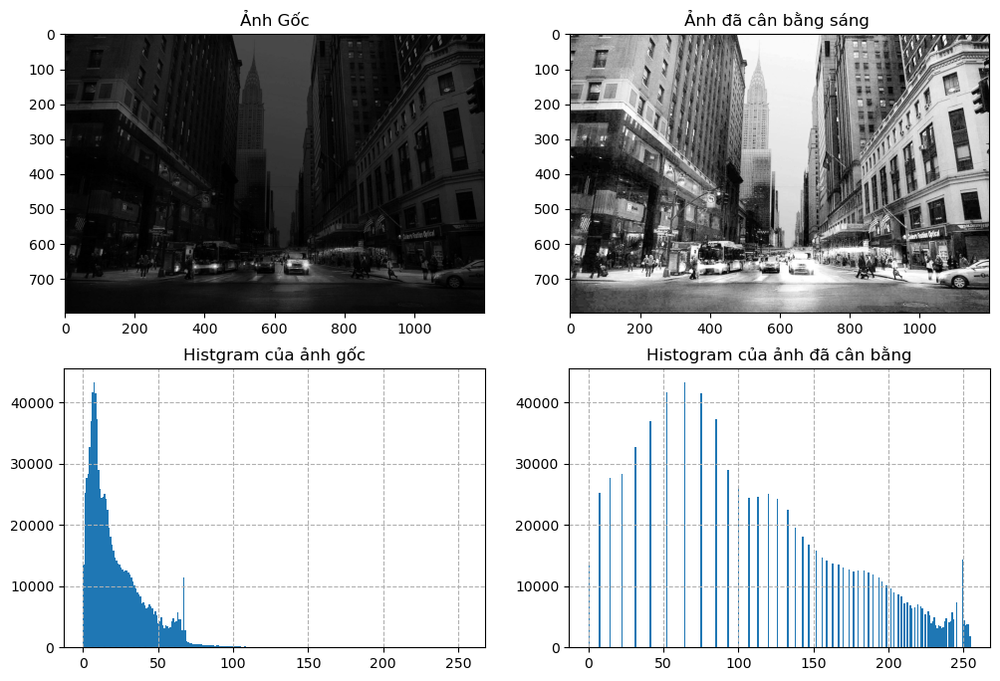

In [70]:
#Đọc ảnh pic1:
img1 = cv2.imread('images/pic1.jpg', 0)

#Thực hiện cân bằng sáng với phương thức equalizeHist():
img_equ1 = cv2.equalizeHist(img1)

#Hiển thị ảnh và Histogram tương ứng.
#Ảnh 1
plt.figure(figsize=(12,8))
plt.subplot(2, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title('Ảnh Gốc')

plt.subplot(2, 2, 3)
plt.hist(img1.ravel(),256,[0,255])
plt.title('Histgram của ảnh gốc')
plt.grid(ls='--')
#Ảnh 2:
plt.subplot(2, 2, 2)
plt.imshow(img_equ1, cmap='gray')
plt.title('Ảnh đã cân bằng sáng ')

plt.subplot(2, 2, 4)
plt.hist(img_equ1.ravel(),256,[0,255])
plt.title('Histogram của ảnh đã cân bằng')
plt.grid(ls='--')
plt.show()

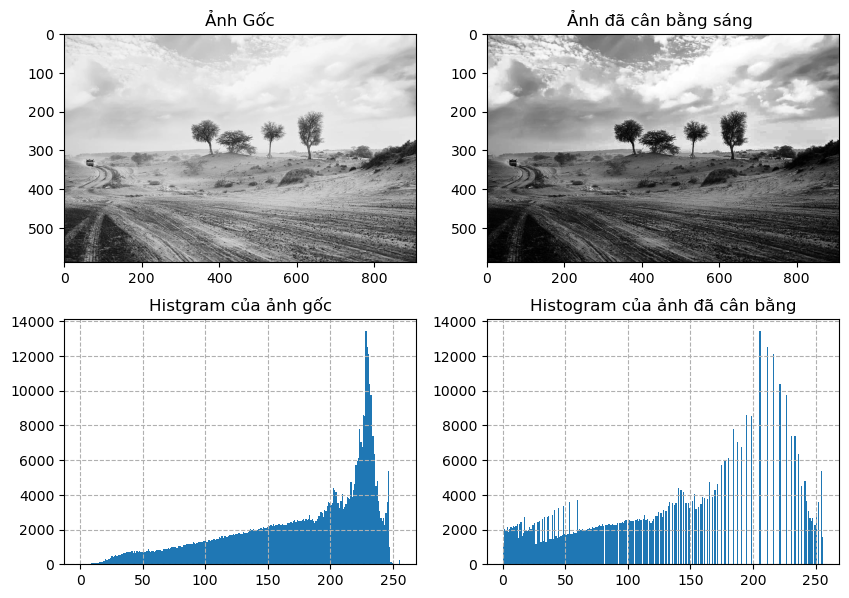

In [71]:
#Đọc ảnh pic2:
img2 = cv2.imread('images/pic2.jpg', 0)

#Thực hiện cân bằng sáng với phương thức equalizeHist():
img_equ2 = cv2.equalizeHist(img2)

#Hiển thị ảnh và Histogram tương ứng.
#Ảnh 1
plt.figure(figsize=(10,7))
plt.subplot(2, 2, 1)
plt.imshow(img2, cmap='gray')
plt.title('Ảnh Gốc')

plt.subplot(2, 2, 3)
plt.hist(img2.ravel(),256,[0,256])
plt.title('Histgram của ảnh gốc')
plt.grid(ls='--')
#Ảnh 2:
plt.subplot(2, 2, 2)
plt.imshow(img_equ2, cmap='gray')
plt.title('Ảnh đã cân bằng sáng ')

plt.subplot(2, 2, 4)
plt.hist(img_equ2.ravel(),256,[0,256])
plt.title('Histogram của ảnh đã cân bằng')
plt.grid(ls='--')

plt.show()

**Để cân bằng sáng trên ảnh màu:**
* Convert sang không gian YUV, trong đó Y là độ sáng (luma hay brightness), U và V là kênh màu.
* Áp dụng equalizeHist trên kênh Y
* Convert trở về RGB (hoặc BGR tuỳ ảnh gốc)


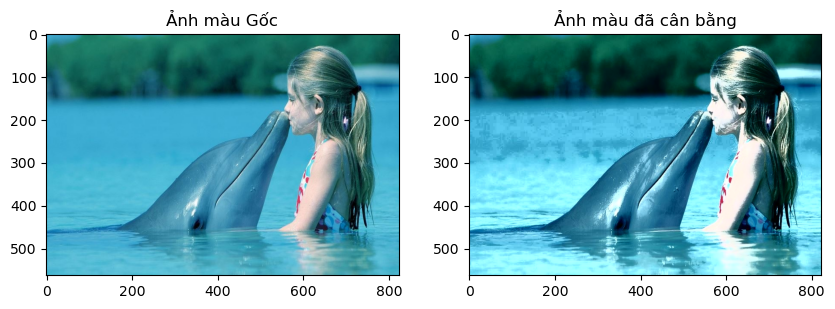

In [72]:
#Đọc ảnh màu:
img_bgr = cv2.imread('images/fish.jpg')

#Chuyển đổi từ hệ màu BGR sang YUV:
img_yuv = cv2.cvtColor(img_bgr,cv2.COLOR_BGR2YUV)

#Cân bằng sáng trên kênh Y:
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

#chuyển đổi ngược ảnh đã cân bằng từ hệ YUV  về BGR:
img_bgr2 = cv2.cvtColor(img_yuv,cv2.COLOR_YUV2BGR)

#Hiển thị ảnh gốc và ảnh đã cân bằng sáng:
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_bgr,cv2.COLOR_BGR2RGB))
plt.title('Ảnh màu Gốc')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_bgr2,cv2.COLOR_BGR2RGB))
plt.title('Ảnh màu đã cân bằng')

plt.show()

## THỰC HÀNH 2.7: 
---
Yêu cầu :
* Yêu cầu 1: Sinh viên đọc ảnh images/Thuchanh2_6.jpg ở dạng ảnh xám. Thực hiện cân bằng sáng trên ảnh Xám, hiển thị ảnh gốc và ảnh sau cần bằng cùng với Histogram tương ứng của mỗi ảnh.
* Yêu cầu 2: Sinh viên đọc ảnh images/Thuchanh2_6.jpg ở dạng ảnh màu. Thực hiện cân bằng sáng trên ảnh màu, hiển thị ảnh gốc và ảnh sau cần bằng ở dạng ảnh màu.
* Yêu cầu 3: Lưu ảnh xám và ảnh màu đã cân bằng vào thư mục images/Saves.

<img src = 'images/Thuchanh2_6.jpg' width='150px'>

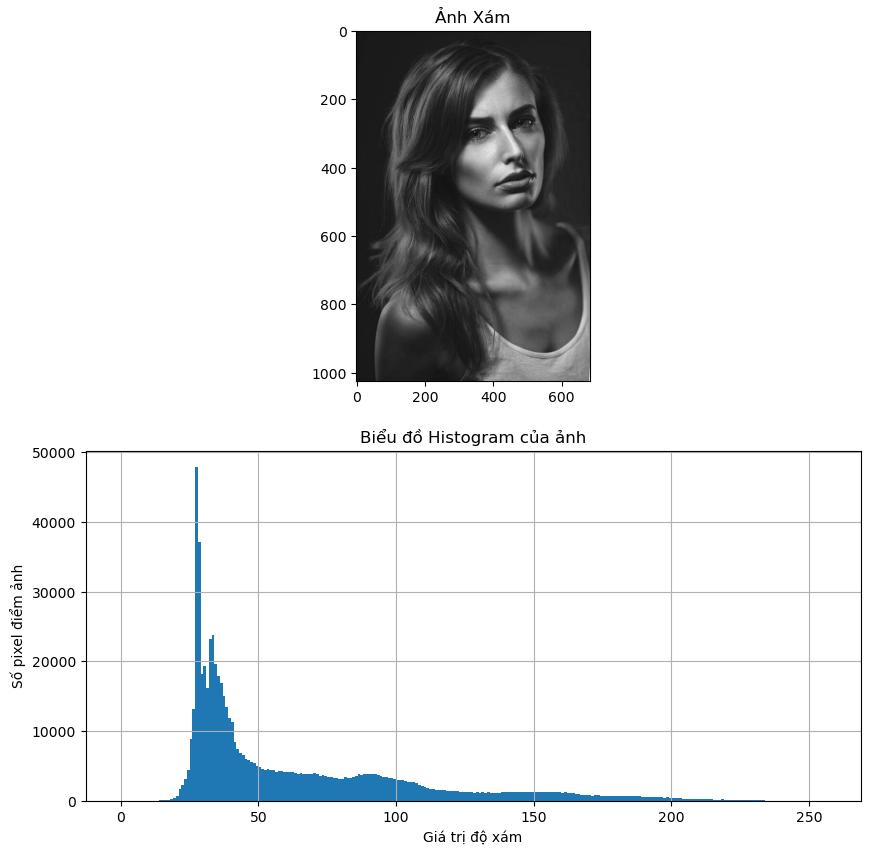

In [88]:
#{SINH VIÊN VIẾT CODE Ở ĐÂY}

#hiển thị ảnh
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.imshow(img_th2_6,cmap='gray')
plt.title('Ảnh Xám')

plt.subplot(2, 1, 2)
plt.hist(img_th2_6.ravel(),256,[0,256]); 
plt.title('Biểu đồ Histogram của ảnh')
plt.xlabel('Giá trị độ xám')
plt.ylabel('Số pixel điểm ảnh')
plt.grid()

plt.show()
# --> ảnh Xám có biểu đồ histogram nghiên về bên trái nên đây là ảnh tối



### Note: Equalize Histogram:
---
Tuy nhiên không phải lúc nào Equalize Histogram toàn bộ ảnh cũng giúp đạt kết quả mong muốn

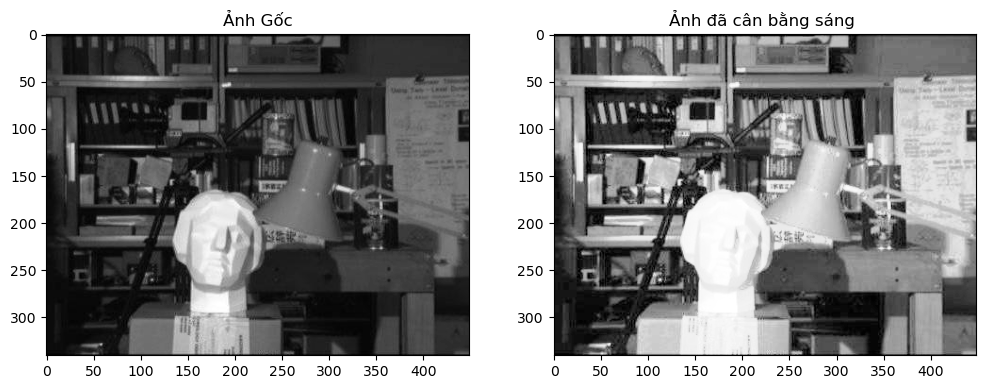

In [74]:
#YÊU CẦU 1: Đọc ảnh xám:
img_25 = cv2.imread('images/pic_statue.jpg',0)

#Thực hiện cân bằng sáng với phương thức equalizeHist():
img_equ2 = cv2.equalizeHist(img_25)

#Hiển thị ảnh và Histogram tương ứng.
#Ảnh 1
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
plt.imshow(img_25, cmap='gray')
plt.title('Ảnh Gốc')

plt.subplot(1, 2, 2)
plt.imshow(img_equ2, cmap='gray')
plt.title('Ảnh đã cân bằng sáng ')
plt.show()

Để giải quyết trường hợp này, ta cần dùng một phương pháp Histogram Equalization đặc biệt. Ảnh sẽ được chia thành các khối viên gạch "tiles" nhỏ (tileSize default của OpenCV là 8x8). Sau đó mỗi khối này được Equalize Histogram riêng. Nhờ đó histogram sẽ chỉ giới hạn trong một vùng nhỏ.

Thư viện OpenCV cung cấp hàm: CLAHE (Contrast Limited Adaptive Histogram Equalization)

cv2.createCLAHE() - https://docs.opencv.org/3.3.0/d7/dbd/group__imgproc.html#gad689d2607b7b3889453804f414ab1018

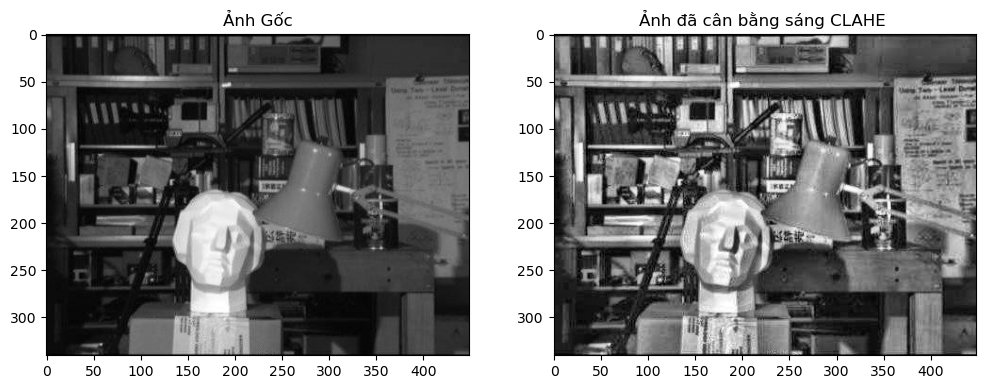

In [75]:
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(15,15))
img_clahe = clahe.apply(img_25)

#Hiển thị ảnh:
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
plt.imshow(img_25, cmap='gray')
plt.title('Ảnh Gốc')

plt.subplot(1, 2, 2)
plt.imshow(img_clahe, cmap='gray')
plt.title('Ảnh đã cân bằng sáng CLAHE ')
plt.show()

### Yêu cầu 4: Đọc ảnh Thuchanh2_6.jpg ở dạng ảnh Xám.
- Thực hiện cân bằng sáng toàn ảnh, cân bằng theo từng vùng 15x15.
- Hiển thị 3 ảnh: Ảnh gốc - Ảnh cân bằng toàn ảnh - Ảnh cân bằng theo vùng 15x15.


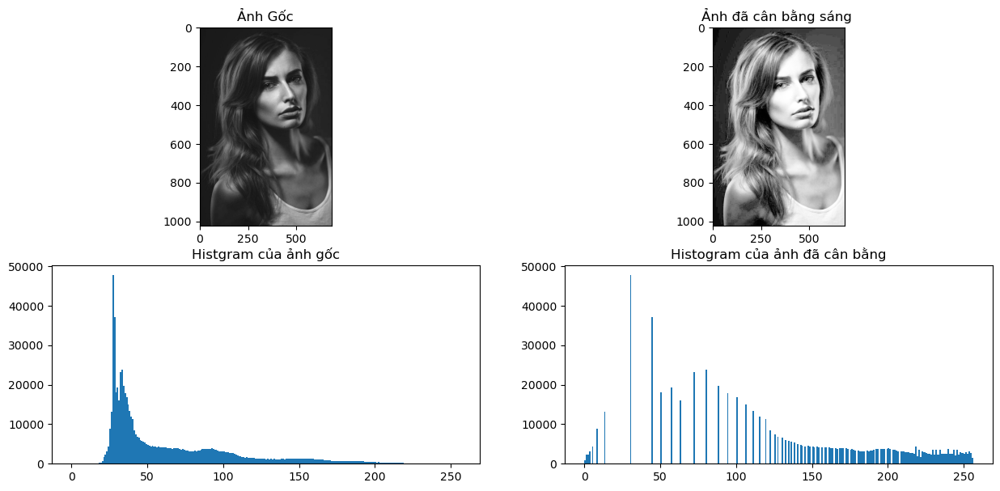

In [90]:
#cân bằng sáng bằng ảnh xám
img_den_nau=cv2.imread('images/Thuchanh2_6.jpg',0)
#Thực hiện cân bằng sáng với phương thức equalizeHist():
img_equ1 = cv2.equalizeHist(img_den_nau)

#Ảnh 1
plt.figure(figsize=(15,7))
plt.subplot(2, 2, 1)
plt.imshow(img_den_nau, cmap='gray')
plt.title('Ảnh Gốc')

plt.subplot(2, 2, 3)
plt.hist(img_den_nau.ravel(),256,[0,256])
plt.title('Histgram của ảnh gốc')

#Ảnh 2:
plt.subplot(2, 2, 2)
plt.imshow(img_equ1, cmap='gray')
plt.title('Ảnh đã cân bằng sáng ')

plt.subplot(2, 2, 4)
plt.hist(img_equ1.ravel(),256,[0,256])
plt.title('Histogram của ảnh đã cân bằng')
plt.show()
